# Shallow Water Equations

The hyperbolic system to be solved are the Shallow Water Equations (SWEs) with flat bottom in 1D:
$$
\begin{aligned}
\partial_t h + \partial_x (hu) &= 0, \\
\partial_t (hu) + \partial_x \left( hu^2 + \frac{1}{2}gh^2 \right) &= 0.
\end{aligned}
$$
in $[\ell_b, u_b]\times[0,T]$,  with $u(x,0)=u_0(x)$.

## Libraries and Dependencies

In [1]:
import sys
import torch
from collections import OrderedDict

from pyDOE import lhs
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
import time

np.random.seed(1234)

In [2]:
# CUDA support 
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

## Physics-informed Neural Networks

In [3]:
# the deep neural network
class DNN(torch.nn.Module):   #Subclassing torch's nn module
    def __init__(self, layers):
        super(DNN, self).__init__() #The same as super().__init__()
        
        #Parameters
        self.depth = len(layers) - 1
        
        # Activation function
        self.activation = torch.nn.Tanh

        # Set up layer order dictionary
        layerDict = OrderedDict()
        for i in range(self.depth - 1):
            layerDict[f"layer_{i}"] = torch.nn.Linear(layers[i], layers[i+1])
            layerDict[f"activation_{i}"] = self.activation()
        layerDict[f"layer_{self.depth-1}"] = torch.nn.Linear(layers[-2], layers[-1])
        
        # deploy layers
        self.layers = torch.nn.Sequential(layerDict)
        
    def forward(self, x):
        out = self.layers(x)
        return out

There are two loss functions:
- The mean squared error of the PDE residual (We use the automatic differentiation to compute the derivatives)
$$
\mathcal{L}_{\mathrm{f}} = \frac{1}{N_{\mathrm{f}}}\sum_{i=1}^{N_{\mathrm{f}}} f(x_i,t_i)= \frac{1}{N_{\mathrm{f}}}\sum_{i=1}^{N_{\mathrm{f}}} \left[\left( u_t + u u_x - \nu u_{xx} \right)^2\right]_{x=x_i,t=t_i}
$$
- The mean squared error of the initial condition and boundary conditions
$$
\mathcal{L}_{\mathrm{u}} = \frac{1}{N_{\mathrm{u}}}\sum_{i=1}^{N_{\mathrm{u}}} \left( u(x_k,t_k) - u_k\right)^2,
$$ 
where $u_k$ is the known value of the solution at the $k$-th boundary point.

In [4]:
# the physics-guided neural network
class PhysicsInformedNN():
    def __init__(self, X_u, u, X_f, layers, lb, ub):#, nu):
        
        # boundary conditions
        self.lb = torch.tensor(lb).float().to(device)
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)
        self.u = torch.tensor(u).float().to(device)
        
        self.layers = layers
        #self.nu = nu
        
        # deep neural networks
        self.dnn = DNN(layers).to(device)
        # optimizers: using the same settings
        self.optimizer = torch.optim.LBFGS(
            self.dnn.parameters(), 
            lr=1.0, 
            max_iter=1000, 
            max_eval=None,#50000, 
            #history_size=50,
            tolerance_grad=1e-5, 
            tolerance_change= 1e-9, #1.0 * np.finfo(float).eps,
            history_size=100,
            line_search_fn="strong_wolfe",       # can be "strong_wolfe"
        )

        self.iter = 0
        
    def net_u(self, x, t): 
        """ Here net_u represents the neural network approximation of the solution u""" 
        u = self.dnn(torch.cat([x, t], dim=1))
        return u
    
    def net_f(self, x, t):
        """ Here net_f represents the residual function
        f(u) = u_t + f(u)_x,
        where u is net_u, the neural network output, and the derivatives
        are calculated with automatic differentiation.
        """
        def flux(u):
            f = torch.zeros_like(u)
            f[:,0] = u[:,1] #q
            f[:,1] = u[:,1]**2/u[:,0] + 0.5*u[:,0]**2 #q^2/h + 1/2*g*h^2, g =1.
            return f

        u = self.net_u(x, t) #u[:,0] contains h(depth), u[:,1] contains q(momentum)
        fu = flux(u)
        u_t = torch.autograd.grad(
            u, t, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_x = torch.autograd.grad(
             u, x, 
             grad_outputs=torch.ones_like(u),
             retain_graph=True,
             create_graph=True
         )[0]
        fu_x = torch.autograd.grad(
            fu, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        f = (1/(0.1*(abs(u_x)-u_x)+1))*(u_t + fu_x) 
        return f

    
    def loss_func(self):
        self.optimizer.zero_grad()
        
        u_pred = self.net_u(self.x_u, self.t_u)
        f_pred = self.net_f(self.x_f, self.t_f)
        loss_u = torch.mean((self.u - u_pred) ** 2)
        loss_f = torch.mean(f_pred ** 2)
        
        loss = 10*loss_u + loss_f
        
        loss.backward()
        self.iter += 1
        if self.iter % 100 == 0:
            print(
                f"Iter {self.iter}, Loss: {loss.item():.5e}, Loss_u: {loss_u.item():.5e}, Loss_f: {loss_f.item():.5e}"
            )
        return loss
    
    def train(self):
        self.dnn.train()
        # Backward and optimize
        self.optimizer.step(self.loss_func)

            
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval()
        u = self.net_u(x, t)
        f = self.net_f(x, t)
        u = u.detach().cpu().numpy()
        f = f.detach().cpu().numpy()
        return u, f

## Configurations

In [5]:
noise = 0.0        

N_u = 100
N_f = 10000
layers = [2, 50, 50, 50, 50, 50, 50, 50, 50, 2]

data = np.load("./data/SWEs_data_CLAWPACK.npy", allow_pickle=True).item()


t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']) #shape is (n_t,2, n_x)

X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))
q = Exact[:,:,1].flatten()[:,None] #Momentum
h = Exact[:,:,0].flatten()[:,None] #Depth

u_star = np.hstack((h,q)) #shape is (n_t*n_x,2)             

# Domain bounds
lb = X_star.min(0)
ub = X_star.max(0)    

xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) # each row contains [x,t=0]
uu1 = Exact[0:1,:,:] # each row contains u(x,t=0)
xx2 = np.hstack((X[:,0:1], T[:,0:1])) # each row contains [x=-1,t]
uu2 = Exact[:,0:1,:] # each row contains u(x=-1,t)
xx3 = np.hstack((X[:,-1:], T[:,-1:])) # each row contains [x=1,t]
uu3 = Exact[:,-1:,:] # each row contains u(x=1,t)

#Taking care of shapes
hh1 = uu1[:,:,0].flatten()[:,None]
qq1 = uu1[:,:,1].flatten()[:,None]
hh1_expanded = hh1[:, :, np.newaxis]
qq1_expanded = qq1[:, :, np.newaxis]
uu1 = np.concatenate((hh1_expanded, qq1_expanded), axis=2)


X_u_train = np.vstack([xx1, xx2, xx3])#shape (n_x + 2*n_t, 2)
u_train = np.vstack([uu1, uu2, uu3]) 
u_train=np.squeeze(u_train, axis=1) #shape (n_x + 2*n_t, 2)

X_f_train = lb + (ub-lb)*lhs(2, N_f) #Generating N_f random points in the domain
X_f_train = np.vstack((X_f_train, X_u_train))

idx = np.random.choice(X_u_train.shape[0], N_u, replace=False) #Choosing N_u random points from the (space and time) boundary 
X_u_train = X_u_train[idx, :]
u_train = u_train[idx,:]

## Training

In [6]:
model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub)

In [7]:
%%time

N_epochs = 10
for epoch in range(N_epochs):
    print(f'Epoch {epoch}') 
    model.train()
                 


Iter 100, Loss: 4.27532e-04, Loss_u: 2.10399e-06, Loss_f: 4.06492e-04
Iter 200, Loss: 2.52961e-05, Loss_u: 1.56647e-07, Loss_f: 2.37296e-05
Iter 300, Loss: 4.04133e-06, Loss_u: 4.21461e-08, Loss_f: 3.61987e-06
Epoch 0
CPU times: user 5min 14s, sys: 1min 19s, total: 6min 33s
Wall time: 51.9 s


In [8]:
u_pred, f_pred = model.predict(X_star)

error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)
print('Error u: %e' % (error_u))                     


Error u: 4.292816e-01


## Visualizations

In [9]:
#Retrieving reference data and evaluating the model on a refined grid
x_test = data["x"]
t_test = data["t"]

extrapolation_time = np.linspace(2.,3,200)

u_exact = []
u_frames = []
for j in range(len(t_test)):
   u_test, _ = model.predict(np.hstack((x_test.reshape(-1,1), t_test[j]*np.ones((len(x_test),1)))))
   u_frames.append(u_test)
   u_exact.append(data["usol"][j,:,:])

for k in range(1,len(extrapolation_time)):
   u_test, _ = model.predict(np.hstack((x_test.reshape(-1,1), extrapolation_time[k]*np.ones((len(x_test),1)))))
   u_frames.append(u_test)

### Static plot
The PINN is evaluated in a refined grid, where it was not trained.

In [21]:
list_training_idxs = []
u_predict_training = []
for time in [0.25,0.5,0.75]:
    t = time
    list_training_idxs.append([i for i, training_t in enumerate(X_f_train[:,1]) if abs(t - training_t) < 1.e-4])
    u_predict_training.append(model.predict(X_f_train[list_training_idxs[-1]])[0])

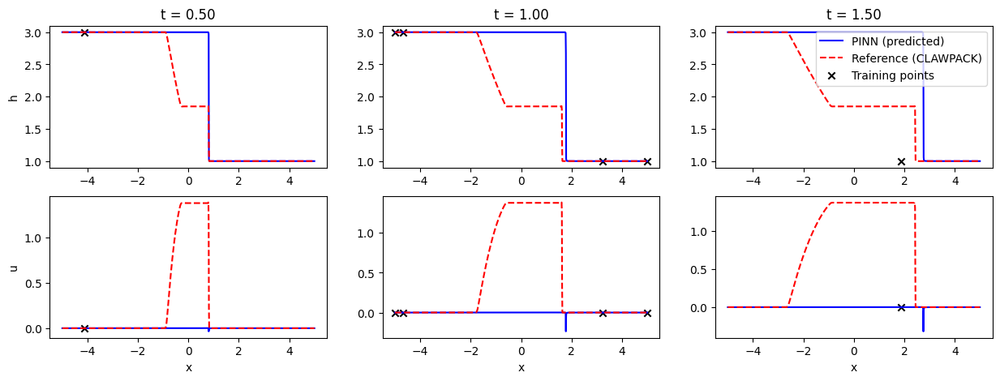

In [22]:
fig, ax = plt.subplots(2,3, figsize=(15,5))
for i in range(3):
    ax[0,i].plot(x_test, u_frames[25+i*25][:,0], 'b-', label='PINN (predicted)')
    ax[0,i].plot(x_test, u_exact[25+i*25][:,0], 'r--', label='Reference (CLAWPACK)')
    ax[0,i].scatter(X_f_train[list_training_idxs[i],0], u_predict_training[i][:,0], color='black', marker='x', label='Training points')
    ax[0,i].set_title(f"t = {t_test[25+i*25][0]:.2f}")

    ax[1,i].plot(x_test, u_frames[25+i*25][:,1], 'b-')
    ax[1,i].plot(x_test, u_exact[25+i*25][:,1], 'r--')
    ax[1,i].scatter(X_f_train[list_training_idxs[i],0], u_predict_training[i][:,1], color='black', marker='x')
    ax[1,i].set_xlabel('x')

ax[0,0].set_ylabel('h')
ax[1,0].set_ylabel('u')
ax[0,-1].legend(loc='upper right')

### Animation

In [13]:
list_training_idxs = []
u_predict_training = []
for time in t_test:
    t = time[0]
    list_training_idxs.append([i for i, training_t in enumerate(X_f_train[:,1]) if abs(t - training_t) < 1.e-4])
    u_predict_training.append(model.predict(X_f_train[list_training_idxs[-1]])[0])

In [16]:
def animation_function(x_test,t_test, u_frames, u_exact):
    from matplotlib import animation, rc
    from IPython.display import HTML
   
    fig, ax = plt.subplots(2,1,figsize=(8,5))
    ax[0].set_xlim(( min(x_test), max(x_test)))
    ax[0].set_ylim((0.0, 3.1))
    ax[0].set_xlabel('$x$')

    ax[1].set_xlim(( min(x_test), max(x_test)))
    ax[1].set_ylim((-2., 2.))
    ax[1].set_xlabel('$x$')
    
    ax[0].set_ylabel('$h(t,x)$ (depth)')

    ax[1].set_ylabel('$u(t,x)$ (velocity)')
    original_title = f'1D SWEs'
    ax[0].set_title(original_title)
    line1, = ax[0].plot([], [], lw=2, label='PINN')
    line2, = ax[0].plot([], [], lw=2, label='Reference (CLAWPACK)', color='black', linestyle='dotted')
    dots = ax[0].scatter([], [], s=20, c='g', marker='x', label='Training ICs')

    line3, = ax[1].plot([], [], lw=2)
    line4, = ax[1].plot([], [], lw=2, color='black', linestyle='dotted')
    dots2 = ax[1].scatter([], [], s=20, c='g', marker='x')

    dotsPDEh = ax[0].scatter([], [], s=20, c='r', marker='o', label='Training PDEs')
    dotsPDEhu = ax[1].scatter([], [], s=20, c='r', marker='o')


    reduced_idx = np.array([i for i in idx if i<xx1.shape[0]-1 ])

    
    #Initialization function
    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        dots.set_offsets(np.column_stack(([], [])))
        line3.set_data([], [])
        line4.set_data([], [])
        dots2.set_offsets(np.column_stack(([], [])))

        dotsPDEh.set_offsets(np.column_stack(([], [])))
        dotsPDEhu.set_offsets(np.column_stack(([], [])))

        return line1, line2, line3, line4, dots, dots2, dotsPDEh, dotsPDEhu

    #Animation function
    def animate(i):
        x = x_test
        if i<=len(u_exact)-1:
            line1.set_data(x, u_frames[i][:,0])
            line2.set_data(x, u_exact[i][:,0])
            line3.set_data(x, u_frames[i][:,1])
            line4.set_data(x, u_exact[i][:,1])
            if i==0:
                dots.set_offsets(np.column_stack((xx1[reduced_idx,0], uu1[reduced_idx,0,0])))
                dots2.set_offsets(np.column_stack((xx1[reduced_idx,0], uu1[reduced_idx,0,1]/uu1[reduced_idx,0,0])))
                dotsPDEh.set_offsets(np.column_stack(([], [])))
                dotsPDEhu.set_offsets(np.column_stack(([], [])))
            else:
                dots.set_offsets(np.column_stack(([], [])))
                dots2.set_offsets(np.column_stack(([], [])))
                dotsPDEh.set_offsets(np.column_stack((X_f_train[list_training_idxs[i],0], u_predict_training[i][:,0])))
                dotsPDEhu.set_offsets(np.column_stack((X_f_train[list_training_idxs[i],0],
                u_predict_training[i][:,1]/u_predict_training[i][:,0])))
        else:
            line1.set_color('r')
            line1.set_data(x, u_frames[i][:,0])
            line2.set_data([], [])
            line3.set_color('r')
            line3.set_data(x, u_frames[i][:,1])
            line4.set_data([], [])
            dotsPDEh.set_offsets(np.column_stack(([], [])))
            dotsPDEhu.set_offsets(np.column_stack(([], [])))

        return line1, line2, dots, line3, line4, dots2, dotsPDEh, dotsPDEhu
    #Call the animator
    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                    frames=len(u_frames), interval=60, blit=True)
    ax[0].legend()
    plt.close()
    #plot the animation
    return HTML(anim.to_jshtml())


In [17]:
plot = animation_function(x_test,t_test,u_frames, u_exact)

Once the PINN line becomes red, we are extrapolating in time.
Training ICs denotes the PINN evaluated at points that where used to enforce the initial condition.
Training PDE denotes the PINN evaluated at points that where used to enforce the PDE.

In [18]:
plot